# Performing integrative analysis on scRNA-seq data and 10x Visium data of Human Lymph Node with STEP

This tutorial showcases the workflow of integrating two modalities with STEP where they are firstly co-embeded into a shared latent space; then the spatial domains(and subdomains) are identified based on the obtained embedding; subsequently, the cell-type composition of each spot is inferred based on the identified domains and according to the embedding in the shared latent space.

## Loading packages

In [1]:
import torch
import scanpy as sc
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import os

from step import crossModel
from step.utils.data import plot_posterior_mu_vs_data
    
sc_file = './results/lymph/human_lymph_integrated.h5ad'
sc_pth = './results/lymph/human_lymph_integrated.pth'
st_pth = './results/lymph/human_lymph_st_decoder.pth'
st_file = './results/lymph/human_lymph_filtered.h5ad'

if not os.path.exists('./results/lymph'):
    os.makedirs('./results/lymph')

## Load data

This data loading part refers to the [tutorial of cell2location](https://cell2location.readthedocs.io/en/latest/notebooks/cell2location_tutorial.html#Mapping-human-lymph-node-cell-types-to-10X-Visium-with-Cell2location)

In [2]:
adata_ref = sc.read(
    f'./data/lymph_sc.h5ad',
    backup_url='https://cell2location.cog.sanger.ac.uk/paper/integrated_lymphoid_organ_scrna/RegressionNBV4Torch_57covariates_73260cells_10237genes/sc.h5ad'
)

In [3]:
adata_vis = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata_vis.var_names_make_unique()

In [4]:
adata_vis.var['SYMBOL'] = adata_vis.var_names
adata_vis.var.set_index('gene_ids', drop=True, inplace=True)

In [5]:
adata_ref.var['SYMBOL'] = adata_ref.var.index
# rename 'GeneID-2' as necessary for your data
adata_ref.var.set_index('GeneID-2', drop=True, inplace=True)

# delete unnecessary raw slot (to be removed in a future version of the tutorial)
del adata_ref.raw

## Initialize the STEP instance

Initialization of STEP instance requires set the following parameters:
- `sc_adata`: Anndata of scRNA-seq data
- `st_adata`: Anndata of spatial data
- `n_top_genes` or `geneset`: using hvgs or specified geneset
- `batch_key`: a column name of `sc_adata.obs` specifying the batches in scRNA-seq data
- `class_key`: a column name of `sc_adata.obs` specifying the cell-type annoations in scRNA-seq data
- `decoder_type`: distribution(zinb or nb, default zinb) to model gene expression data.

Other parameters are about model settings:
- `module_dim`: dimension of final embedding
- `hidden_dim`: dimension of hidden layers
- `n_moudles`: number of gene modules
- `dec_norm`: normalization layer used in decoder,
    - 'layer': LayerNorm
    - 'batch': BatchNorm
    - None: not using any normalization layer
- `n_dec_hid_layers`: number of hidden layers used in decoder.

In [6]:
proc = crossModel(
    sc_adata=adata_ref,
    st_adata=adata_vis,
    n_top_genes=2000,
    layer_key=None,
    batch_key='Sample',
    class_key='Subset',
    module_dim=30,
    hidden_dim=64,
    n_modules=32,
    decoder_type='nb',
    dec_norm=None,
    n_dec_hid_layers=1,
    # model_checkpoint=sc_pth,
)

not log_transformed
Adding count data to layer 'counts'
Dataset Done


In [7]:
proc.adata.obs['Sample'].value_counts()

BCP005_Total              13323
BCP006_Total               4531
4861STDY7462253            4286
4861STDY7462255            4283
V1_Human_Lymph_Node        4035
4861STDY7528597            3888
BCP009_Total               3867
4861STDY7462256            3852
4861STDY7528600            3594
4861STDY7528599            3172
4861STDY7135914            3126
4861STDY7462254            3085
4861STDY7528598            2961
4861STDY7135913            2941
BCP008_Total               2914
Pan_T7935494               2876
BCP003_Total               2083
BCP002_Total               2002
Human_colon_16S8000484     1308
4861STDY7208413            1228
4861STDY7208412            1130
Human_colon_16S7255678     1125
BCP004_Total                985
Human_colon_16S7255677      700
Name: Sample, dtype: int64

## Co-embedding two modalities

In this process, the goal is to extract the information from transcripts, also eliminate the technical/batch effects in the meantime, so the spatial data is not differentiated from scRNA-seq data by ignoring the spatial locations.

The following running parameters
```
tune_epochs=200, 
need_anchors=False,
beta1=1e-2
```
are somewhat special: only when STEP is required to refine the model with cell-type annotations, where `need_anchors=True` is set, the `tune_epochs` is valid and control the number of iterations of the refine process. The `beta1` is the coefficient of KL-divergence, the adjustment of this parameter can result in the change of the degree of embedding's "dispersion": higher values result in the lower degree of "dispersion".

In [8]:
proc.integrate(epochs=400, 
               batch_size=2048, 
               split_rate=0.2, 
               tune_epochs=200, 
               need_anchors=False,
               beta1=1e-2)

Performing category random split
Training size for 4861STDY7135913: 2352
Training size for 4861STDY7135914: 2500
Training size for 4861STDY7208412: 904
Training size for 4861STDY7208413: 982
Training size for 4861STDY7462253: 3428
Training size for 4861STDY7462254: 2468
Training size for 4861STDY7462255: 3426
Training size for 4861STDY7462256: 3081
Training size for 4861STDY7528597: 3110
Training size for 4861STDY7528598: 2368
Training size for 4861STDY7528599: 2537
Training size for 4861STDY7528600: 2875
Training size for BCP002_Total: 1601
Training size for BCP003_Total: 1666
Training size for BCP004_Total: 788
Training size for BCP005_Total: 10658
Training size for BCP006_Total: 3624
Training size for BCP008_Total: 2331
Training size for BCP009_Total: 3093
Training size for Human_colon_16S7255677: 560
Training size for Human_colon_16S7255678: 900
Training size for Human_colon_16S8000484: 1046
Training size for Pan_T7935494: 2300
Training size for V1_Human_Lymph_Node: 3228
train size

 86%|████████▌ | 344/400 [27:23<04:27,  4.78s/epoch, kl_loss=1.198, recon_loss=1147.656, val_kl_loss=1.229/0.233, val_recon_loss=1147.362/1143.838]


Early Stopping triggered
EarlyStopping counter: 30 out of 30
EarlyStopping counter: 344 out of 10


Examine QC plots.

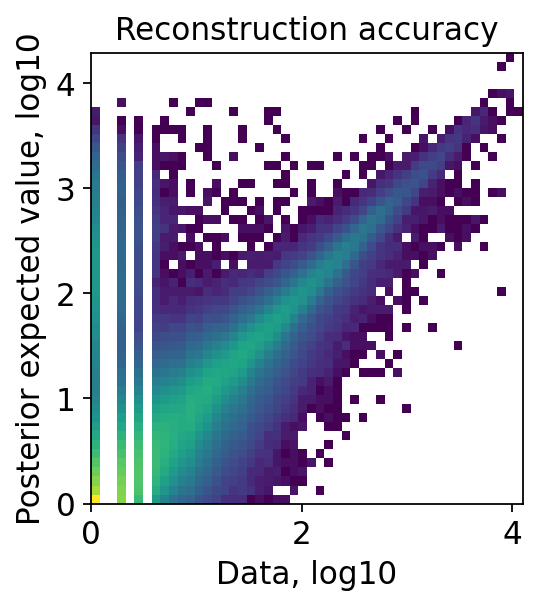

In [9]:
proc.impute(layer_key='counts', qc=True)

### Get and check the co-embedding results

In [10]:
adata = proc.adata

In [11]:
sc.pp.neighbors(adata, use_rep='X_rep')
sc.tl.umap(adata)

As we can see, two modalities manage to "mix" with each other in the left figure. Moreover, in the right figure, we can see that the structure of cell-types is totally preserved, indicating the integration(co-embedding) is biologically meaningful and the technical/batch effects are successfully eliminated.

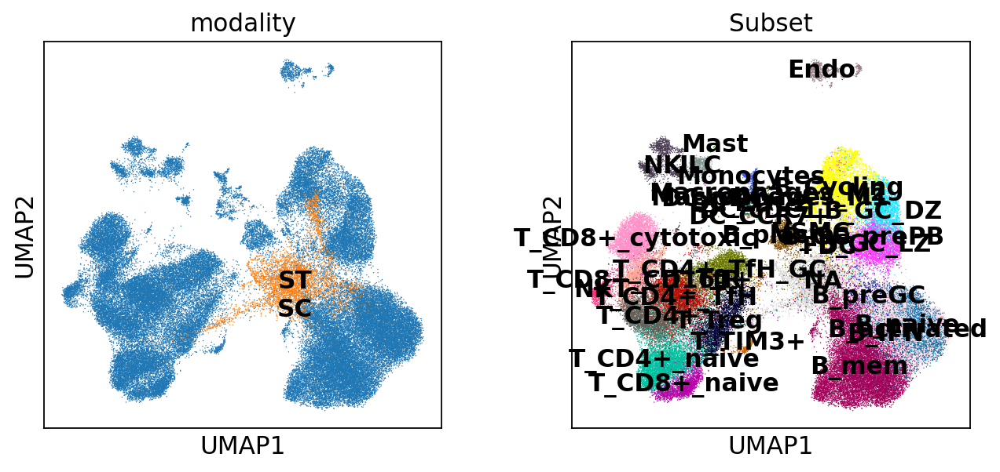

In [12]:
sc.pl.umap(adata, color=['modality', 'Subset'], ncols=2)

In [13]:
torch.save(proc._functional.model.state_dict(), sc_pth)

## Zonation after integration

Zonation, i.e. identification of spatial domains, is then conducted on the obtained embedding in the previous co-embedding process.

<div class="alert alert-info">

**Note:** This process required embedding produced in the previous 
    process, so if the adata is not saved while the model(paramters) is saved, 
    load the step instance `proc` and use `proc.add_embed(key_added='<your desired key name>')`
</div>

Training a spatial smoother(GCN) to spatially smooth the embedding extracted solely from transcprits. This training stage only involves the spatial data and is achieved in two sub-stage:
1. (Optional) Traning a spatial-data-specific decoder for the concentration on spatial data. This sub-stage still doesn't utilize the spatial context, and is controlled by the following parameters: 
    - `epochs`: #epochs, 
    - `batch_size`: batch size, 
    - `n_dec_layers`: #layers in decoder, 
    - `split_rate`: the proportion of data used as validation
    - `use_st_decoder`: whether to run this sub-stage,
    - `decoder_type`: the distribution to fit count data.
2. Training the spatial smoother to smooth the embedding of spatial data for zonation. This sub-stage is controlled by the following parameters:
    - `n_glayers`: #graph convolutional layers
    - `smooth_epochs`: #epochs in this sub-stage
    - `tune_lr`: learning rate to tune the st-decoder trained in the previous sub-stage, `None` means not tuning it.

In [14]:
proc.generate_domains(epochs=800, 
                      batch_size=1024,
                      n_dec_layers=1,
                      n_glayers=1,
                      split_rate=0.,
                      tune_lr=None,
                      smooth_epochs=800,
                      use_st_decoder=True,
                      decoder_type='nb')

==============Sub-Dataset Info==============
Batch key: Sample 
Class key: Subset 
Number of Batches: 24 
Number of Classes: 34 
Gene Expr: (4035, 2000)
Rep: (4035, 64)
Batch Label: (4035,)


100%|██████████| 800/800 [00:58<00:00, 13.63epoch/s, recon_loss=4178.889, val_recon_loss=-]


StDecoder trained
Start training smoother


100%|██████████| 800/800 [00:47<00:00, 16.79epoch/s, contrast_loss=5.846, recon_loss=4188.098, val_contrast_loss=-, val_recon_loss=-]


In defualt, the smoothed embedding will be stored in `proc.st_adata.obsm['X_smoothed']`. Here, we use KMeans to cluster the smoothed embedding and obtain 8 spatial domains.

Subdomains is identified by a further clustering based on spatial domains. We identifies 3 subdomains in each domain.

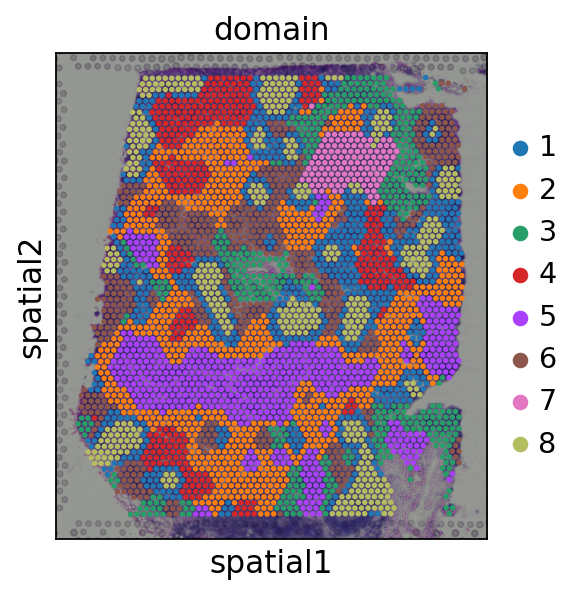

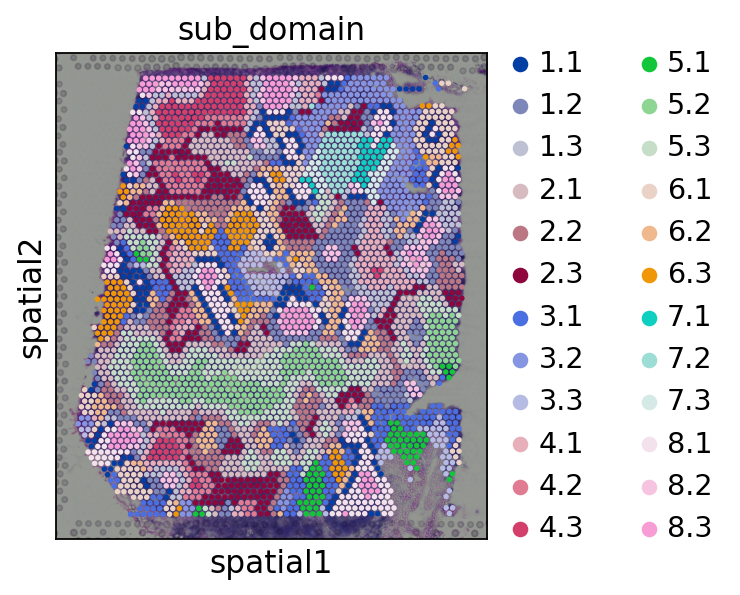

In [15]:
proc.cluster(use_rep='X_smoothed', n_clusters=8)
sc.pl.spatial(proc.st_adata, color=['domain'], size=1.3,)

proc.sub_cluster(proc.st_adata, 
                 pre_key='domain', 
                 use_rep='X_smoothed', 
                 n_clusters=3)
sc.pl.spatial(proc.st_adata, color=['sub_domain'], size=1.3,)

Examine the QC plots with original embedding and smoothed embedding through a same decoder(st-decoder if `use_st_decoder` is set previously)

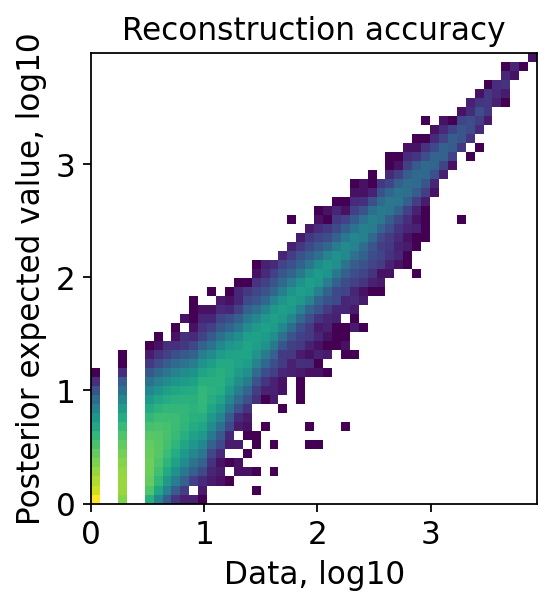

In [16]:
proc.st_impute(qc=True, smooth=False)

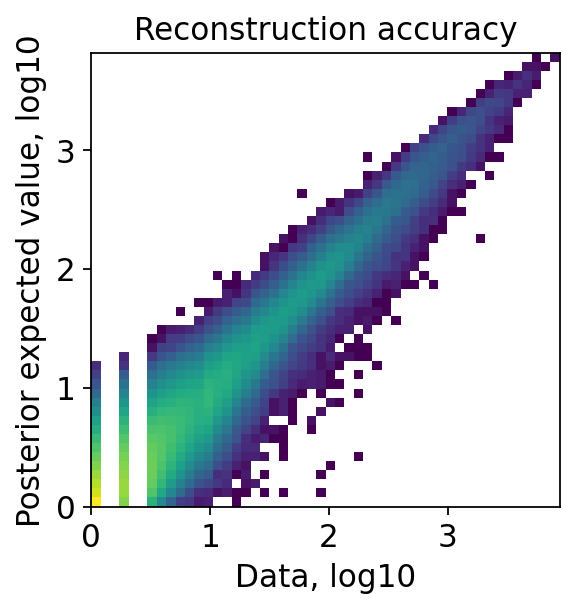

In [17]:
proc.st_impute(qc=True, smooth=True)

## Cell-type deconvolution with obtained embedding

STEP performs deconvolution at domain-wise since the spots in the same spatial domain share a similar cell-type composition. So this process requires two features:
1. Embedding of scRNA-seq and spatial data in the shared latent space obtained in the co-embedding process.
2. Spatial domains or subdomains stored in `proc.st_adata.obs[<domain_key>]`.

The embedding is mainly used to infer the existance of a cell-type in a spot by evaluating the similarity in latent space between the corresponding embedding. Specifically, the embedding of scRNA-seq data is averaged by cell-types, denoted as `anchors`, and the similarity is measured by a *sparse attention mechanism* where "sparse" is to ensure the sparsity of cell-type occurence in a spot. To consider the individual effect in each spot, `anchors` are refined individually for each spot through several(default 2) transformer encoders(can be disabled by setting `hard_anchors=True`). And to bound the refined `anchors`, we add a contrastive loss between refined `anchors` and original `anchors` as a regularization where the parameter`T` is the temperature in the contrastive loss.

The actual cell-type composition in a spot are inferred at transcript-wise by scaling the simlarity matrix inferred in the latent space. This is done by minimizing the negative log-likelihood with the "convolution" of estimated cell-type composition and cell-type signatures. Here the signatures can be obtained by averging the raw counts(set `use_raw=True`) or the decoder-imputed counts(set `use_raw=False`).

For the balance between multiple losses, use parameter `rate` to scale the two majority reconstruction lossess.

In [18]:
proc.st_adata.obs['sub_domain_codes'] = proc.st_adata.obs['sub_domain'].cat.codes

proc.deconv(epochs=2000, 
            domain_key='sub_domain_codes',
            domain_wise=True,
            n_glayers=None,
            use_raw=False,
            hard_anchors=False,
            T=0.1,
            rate=0.01,)

100%|██████████| 2000/2000 [05:14<00:00,  6.36epoch/s, div=2.186, loss_ori=32.250, recon_loss=2080.224, sc_consistency=0.709, val_div=-, val_loss_ori=-, val_recon_loss=-, val_sc_consistency=-]      


In [19]:
st_adata = proc.st_adata

celltypes = proc.adata.obs['Subset'].cat.categories
prop_list = celltypes.to_list()

In [20]:
st_adata

AnnData object with n_obs × n_vars = 4035 × 2000
    obs: 'in_tissue', 'array_row', 'array_col', 'batch_st', 'Sample', 'modality', 'n_genes', 'domain', 'sub_domain', 'sub_domain_codes', 'B_Cycling', 'B_GC_DZ', 'B_GC_LZ', 'B_GC_prePB', 'B_IFN', 'B_activated', 'B_mem', 'B_naive', 'B_plasma', 'B_preGC', 'DC_CCR7+', 'DC_cDC1', 'DC_cDC2', 'DC_pDC', 'Endo', 'FDC', 'ILC', 'Macrophages_M1', 'Macrophages_M2', 'Mast', 'Monocytes', 'NK', 'NKT', 'T_CD4+', 'T_CD4+_TfH', 'T_CD4+_TfH_GC', 'T_CD4+_naive', 'T_CD8+_CD161+', 'T_CD8+_cytotoxic', 'T_CD8+_naive', 'T_TIM3+', 'T_TfR', 'T_Treg', 'VSMC'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt_gene'
    uns: 'spatial', 'domain_colors', 'sub_domain_colors'
    obsm: 'spatial', 'mt', 'X_rep_tsfmr', 'X_smoothed', 'deconv', 'deconv_abundance'
    layers: 'counts', 'st_expected_counts'

### Visualize the inferred cell-type composition

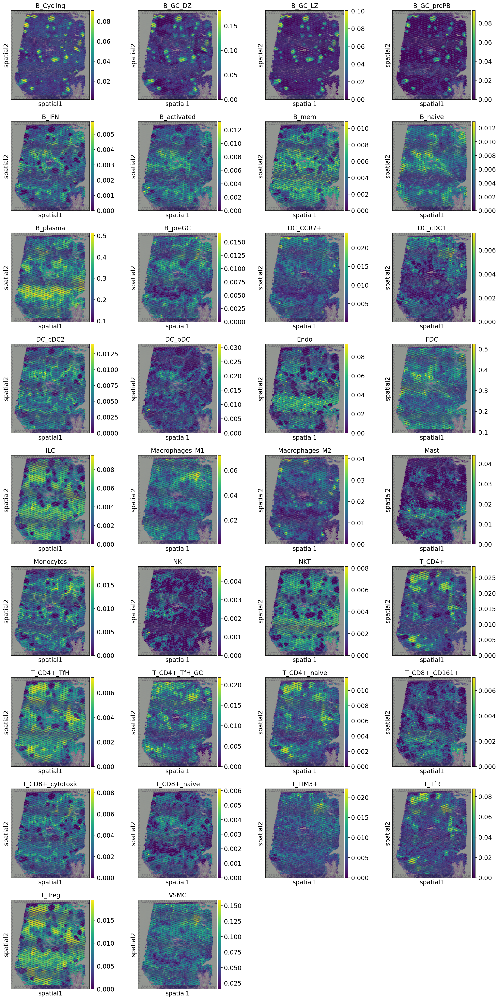

In [21]:
st_adata.obs[prop_list] = st_adata.obsm['deconv']
sc.pl.spatial(st_adata, size=1.3, color=prop_list,)

### Perform spatially DE genes anlaysis

In [22]:
adata_vis.obs['domain'] = st_adata.obs['domain'].astype(str).astype('category')
adata_vis.obsm['X_smoothed'] = st_adata.obsm['X_smoothed']

sc.tl.dendrogram(adata_vis, use_rep='X_smoothed', groupby='domain')
sc.tl.rank_genes_groups(adata_vis, groupby='domain', method='wilcoxon', use_raw=False)

categories: 1, 2, 3, etc.
var_group_labels: 1, 4, 8


{'mainplot_ax': <AxesSubplot:>,
 'group_extra_ax': <AxesSubplot:>,
 'gene_group_ax': <AxesSubplot:>,
 'color_legend_ax': <AxesSubplot:title={'center':'log fold change'}>}

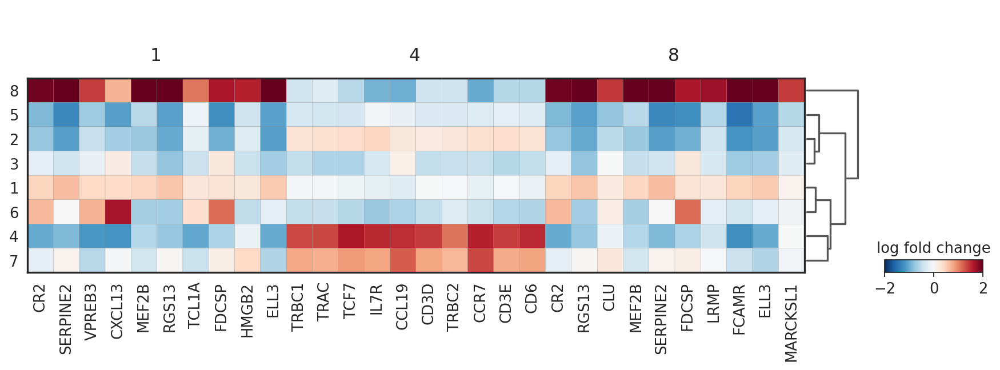

In [23]:
sc.pl.rank_genes_groups_matrixplot(adata_vis, groupby='domain', groups=['1', '4', '8'], values_to_plot='logfoldchanges', cmap='RdBu_r', vmin=-2, vmax=2)

categories: 1, 2, 3, etc.
var_group_labels: 2, 5


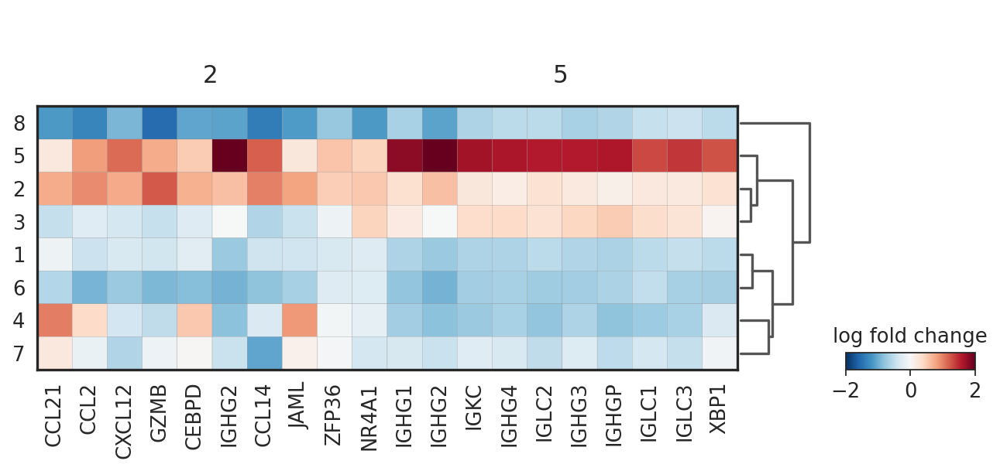

In [24]:
sc.pl.rank_genes_groups_matrixplot(adata_vis, groupby='domain', groups=['2', '5'], values_to_plot='logfoldchanges', cmap='RdBu_r', vmin=-2, vmax=2)

### Summarize the average proportion of selected cell-types in each domain

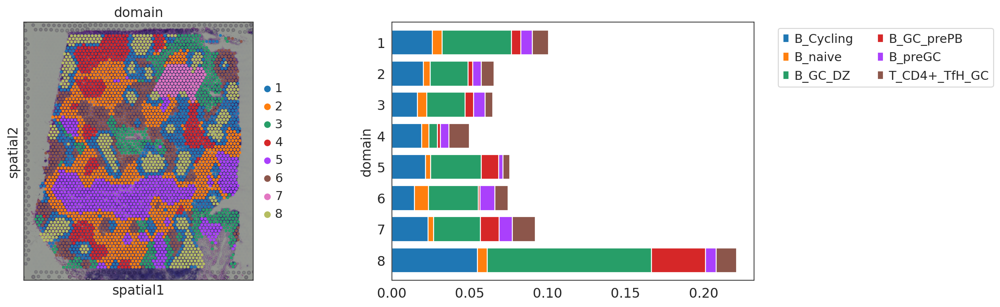

In [25]:
gc = ['B_Cycling', 'B_naive', 'B_GC_DZ', 'B_GC_prePB', 'B_preGC', 'T_CD4+_TfH_GC']
proc.summarize_domain(gc, adata=st_adata)